# <center>Digital Image Processing - Problem Set 2</center>

## Student Names: Luis David Díaz Chica - Juan Camilo Gómez Santofimio - Jessied Marriaga Shaik

### Instructions

This Problem Set covers the topics of Image enhancement in the spatial domain, power law transformations, histogram equalization, smoothing, median filters, image sharpening, Laplacian of an image, image gradients and Sobel operators. <br>

Your solutions to the following problems should include commented source code and a short description of each function. You should test your functions with several input images, besides the ones provided here. Include the input and output images that you used for experimentation. Analyze your results. If you discover something interesting, let us know!

In [1]:
# Libraries needed for appropiate working of the functions developed.

import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from os import listdir, path
%matplotlib inline

imagesnames = listdir('images')    #Por facilidad de trabajo de todas las imagenes se guardaron los nombres de los archivos
#contenidos en el directorio especificado
print imagesnames

['test_pattern_blurring_orig.png', 'face.png', 'z7.jpg', 'pollen.jpg', 'z3.jpg', 'lowContrastPollen.jpg', 'spine.jpg', 'pooltable.jpg', 'ckt_board_saltpep_prob_pt05.png', 'darkPollen.jpg', 'blurry_moon.png', 'z6.jpg', 'contact_lens_original.png', 'runway.jpg', 'z5.jpg', 'g.jpg', 'jiraffe.jpg', 'university.png', 'lightPollen.jpg', 'z1.jpg', 'z2.jpg', 'lena.jpg', 'TGLE.jpg', 'z4.jpg']


### Problem 1

Implement the code for the function below, which runs histogram equalization on a grayscale image. Your code should compute the histogram of the image, and use the cdf as a transformation function. The function should return the equalized image as an array. Use the function to do histogram equalization on the images <tt>darkPollen.jpg</tt>, <tt>lightPollen.jpg</tt>, <tt>lowContrastPollen.jpg</tt>, <tt>pollen.jpg</tt>, <tt>spine.jpg</tt> and <tt>runway.jpg</tt>. Include in the report plots and comparisons between the histograms of the corrected images to those of the originals. Also include a plot of the transformation function that equalizes the input histograms. Please comment your results.

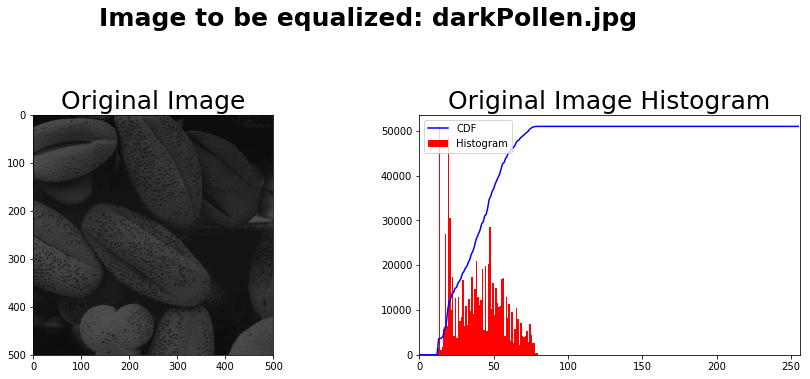

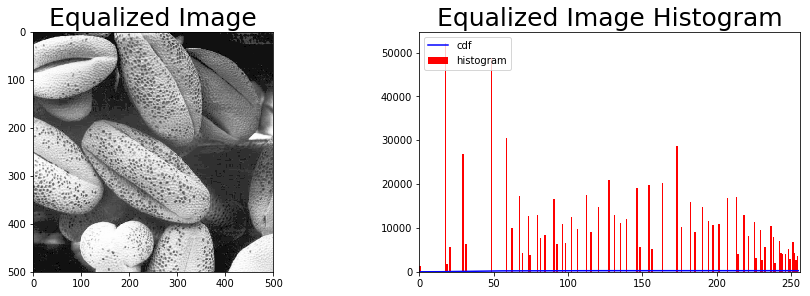

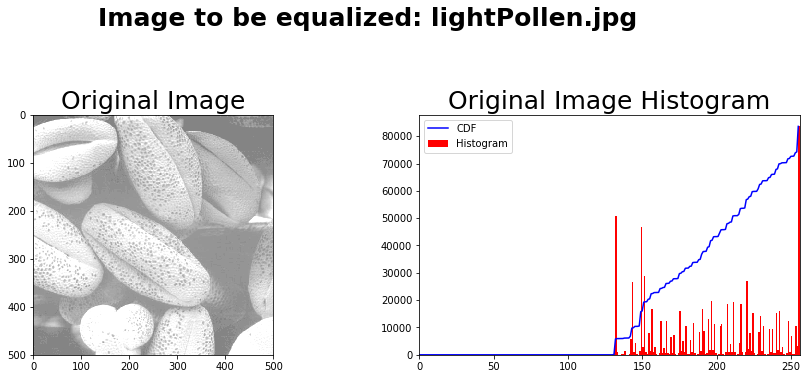

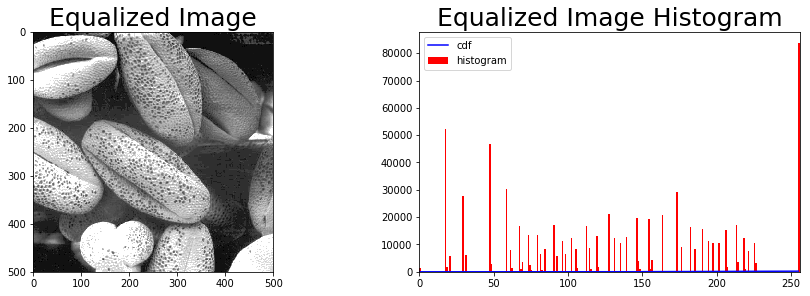

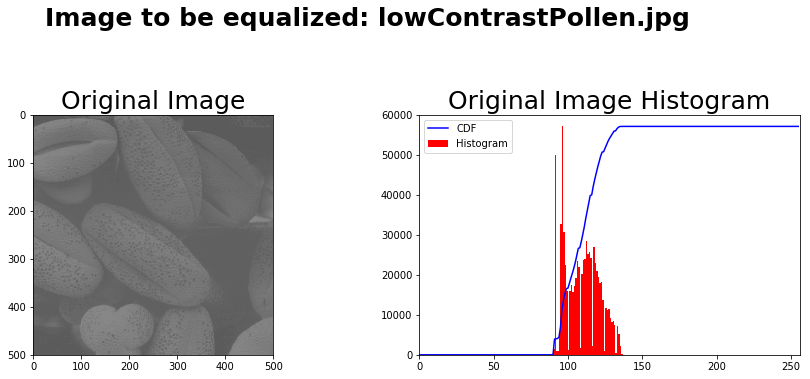

...

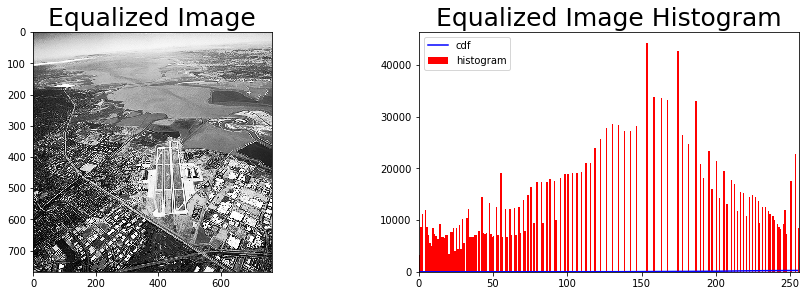

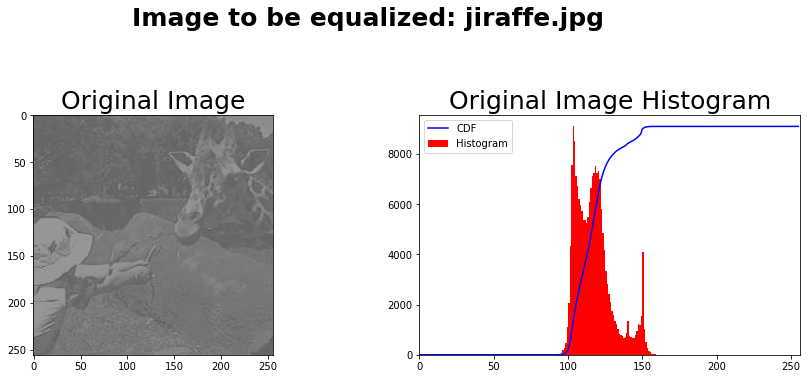

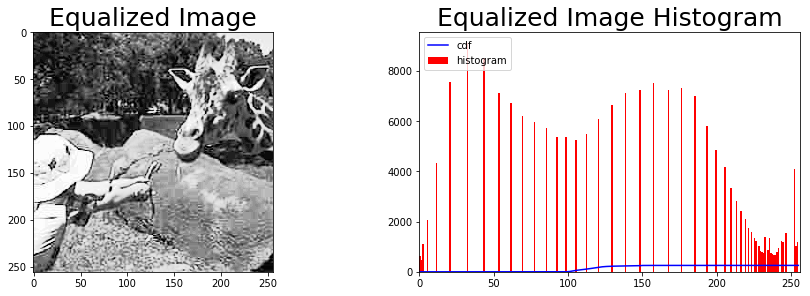

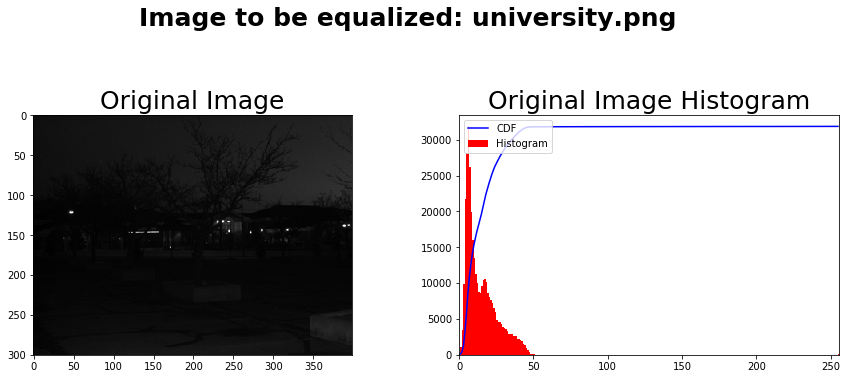

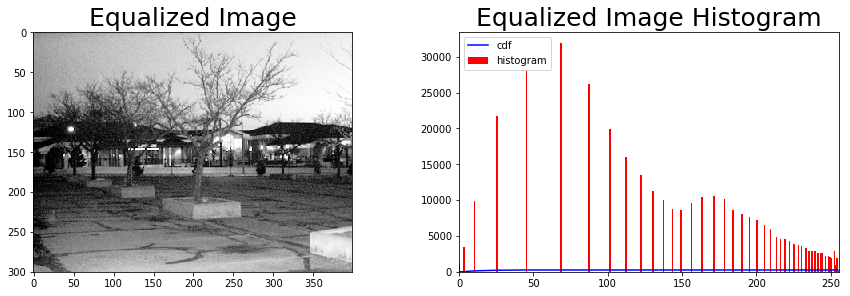

In [4]:
#Define function
def equalize_image(src):
        hist,bins = np.histogram(src.flatten(),256,[0,256])    #For making histogram, the input data needs to be 
        #flatten which converts a matrix in one single array 
        cdf = hist.cumsum()  #Function that returns the cumulative sum of the elements along a given array.
        cdf_normalized = cdf * hist.max()/ cdf.max()   #normalize cumulative distribution function
        plt.title('Original Image Histogram',fontsize=25);
        plt.plot(cdf_normalized, color = 'b');   #Plot cdf normalized in blue color
        plt.hist(src.flatten(),256,[0,256], color = 'r')  #plot histogram of image in red color
        plt.xlim([0,256])   #define x lim
        plt.legend(('CDF','Histogram'), loc = 'upper left')   #Place legend at the upper left side of the figure
        #plt.show()  #Show both histogram and cdf 
        cdf_t= np.ma.masked_equal(cdf,0)   #Since pixels values of 0 do not contribute to an increase in the cdf
        #they were excluded using a mask array which replaces 0 pixel values in the specified array with --
        cdf_t = (cdf_t - cdf_t.min())*255/(cdf_t.max()-cdf_t.min())  #Transformation
        cdf = np.ma.filled(cdf_t,0).astype('uint8')  #Fill elements that corresponds to masked data with a fill value
        #cdf corresponds to a look up table that provides the information of the output pixel value for every input pixel value.
        return [cdf[src],cdf]  #This applies the transform and returns it and it also returns the cdf.

#Read images for further processing
img1 = cv2.imread("images/"+imagesnames[9],1)  
img2 = cv2.imread("images/"+imagesnames[18],1) 
img3 = cv2.imread("images/"+imagesnames[5],1) 
img4 = cv2.imread("images/"+imagesnames[3],1)  
img5 = cv2.imread("images/"+imagesnames[6],1)  
img6 = cv2.imread("images/"+imagesnames[13],1)  
img7 = cv2.imread("images/"+imagesnames[16],1)  
img8 = cv2.imread("images/"+imagesnames[17],1)  
vector_sources = [img1,img2,img3,img4,img5,img6,img7,img8]     #Save in a new array read images in order to make more easy plotting, titling and calling defined functions 
vector_names = [imagesnames[9],imagesnames[18],imagesnames[5],imagesnames[3],imagesnames[6],imagesnames[13],imagesnames[16],imagesnames[17]]  #Save the images names in this array

#Test function
for i,img_name in enumerate(vector_names):#Go over array with images names
    plt.figure(figsize=(15,15));
    plt.suptitle("Image to be equalized: "+ img_name, fontsize=25,fontweight='bold')  #Title every section of images
    plt.subplot(3,2,1);  #Create subplot
    plt.title('Original Image',fontsize=25);   
    plt.imshow(vector_sources[i]); #Plot original image
    plt.subplot(3,2,2);  #Create subplot
    imgequalized,cdft= equalize_image(vector_sources[i]) #Call function that returns both equalized image and cdf
    plt.figure(figsize=(15,15));
    plt.subplot(3,2,1);
    plt.title('Equalized Image',fontsize=25);
    plt.imshow(imgequalized);    #Plot equalized image
    plt.subplot(3,2,2);
    plt.title('Equalized Image Histogram',fontsize=25);  
    plt.plot(cdft, color = 'b') #Plot cumulative distribution function of equalized image
    plt.hist(imgequalized.flatten(),256,[0,256], color = 'r')   #Plot histogram of equalized image
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')  #Place legend in upper left side of histogram
    plt.show()
    

<h3>- Description of developed Function:</h3>
<p style="text-align:justify">The function <i>equalize_image</i> developed in this section takes as its only input the source image to be processed and returns two outputs: the equalized image and the cumulative distribution function of this image. The internal processing of this function is based on histogram equalization theory, which in general terms is accomplished using contrast adjustment on the original image.</p>
<p style="text-align:justify">Histogram Equalization is commonly used when pixel values of an image are confined in only some specific range of values which tipically happens in images with backgrounds and foregrounds that are both bright or both dark. In this cases, it is needed a transformation function that stretches the histogram to their ends to, thereby, have an image with pixels from all regions of the histogram. This could be better understood considering the following image:
<img style="align:center margin: 0px 0px 15px 15px;" src="http://docs.opencv.org/3.1.0/histogram_equalization.png" height="256" width="256">
<p style ="text-align:center">Taken from: http://docs.opencv.org/3.1.0/d5/daf/tutorial_py_histogram_equalization.html</p>
As it is shown in this picture, histogram equalization allows intensities of an image to be better distributed on the histogram which not only makes further processing easier but it also improves its visual quality.</p>
<h3>- Description of library functions used in this section: </h3>
<p style="text-align:justify">
In order to sucessfully attain the goal of this section, it was mandatory to use several functions of the OPENCV and the NUMPY library. Among these functions it was used ".flatten()" from the NUMPY library that returns a copy of the original array (in this case the image) collapsed into one dimension, which is needed to create an histogram. To build the Histogram it was also used a NUMPY function, "np.histogram()", that recieves three parameters as inputs: A flattened array (flattened image), the number of equal-width bins in a given range and the range of the bins. Then, it was used "hist.cumsum()" that calculates the cumulative sum of the elements along the given array which in this case corresponds to the cumulative distribution function. The obtained value was normalized by multiplying it by the maximum value of the histogram previously built and dividing it by the maximum value of the cumulative distribution function. After this, it is showed both the histrogram and the cdf just defined, using the plot function of the MATPLOTLIB library and specifying a legend in the upper left side of the plot to differentiate the cdf from the histogram. However, the function at this point doesn't equalize the histogram, it is still needed the transformation function that maps the input pixels in the region they are, to output pixels in full region of the histogram. Since pixels values of 0 do not contribute to an increase in the cdf, they are excluded using the function "np.ma.masked_equal()" from the NUMPY library. This function recieves two parameters: the array and the value to be masked. This means that this function basically performs <i>a mask WHERE a condition "x == value" is met</i>. With that value omitted, it is applied the needed transformation. But this transformated array has still some values masked, so they need to be filled again with 0 to succesfully do the mapping previously mentioned. To carry out this task, it was used "np.ma.filled()" from the NUMPY library. This function recieves two parameters: the masked array and the fill value for the masked data. Finally, it is used a loop to plot each original image, call the function defined, plot the equalized image and plot both histograms.</p> 

### Problem 2

Implement the code for the function below which performs a power law transformation on an image. This function should take an image array and the gamma value to be used in the transformation as its only input parameters. The function should return a new image array which is the power transformation of the original image. Power law transformations are achieved using the following formula:
$$ g(x,y) = T[f(x,y)] = c \cdot f(x,y) ^ \gamma $$

where $g(x,y)$ is the output pixel value, $f(x,y)$ is the original pixel value, $\gamma$ is the parameter controlling the power law transformation and $c$ is a constant usually set to 1. Note that you convert the image so that the intensity values are in the range 0.0 – 1.0, rather than in 0 – 255.

Try this new function out on the images <tt>spine.jpg</tt> and <tt>runway.jpg</tt>, experimenting with different values for $\gamma$. Please comment your results.

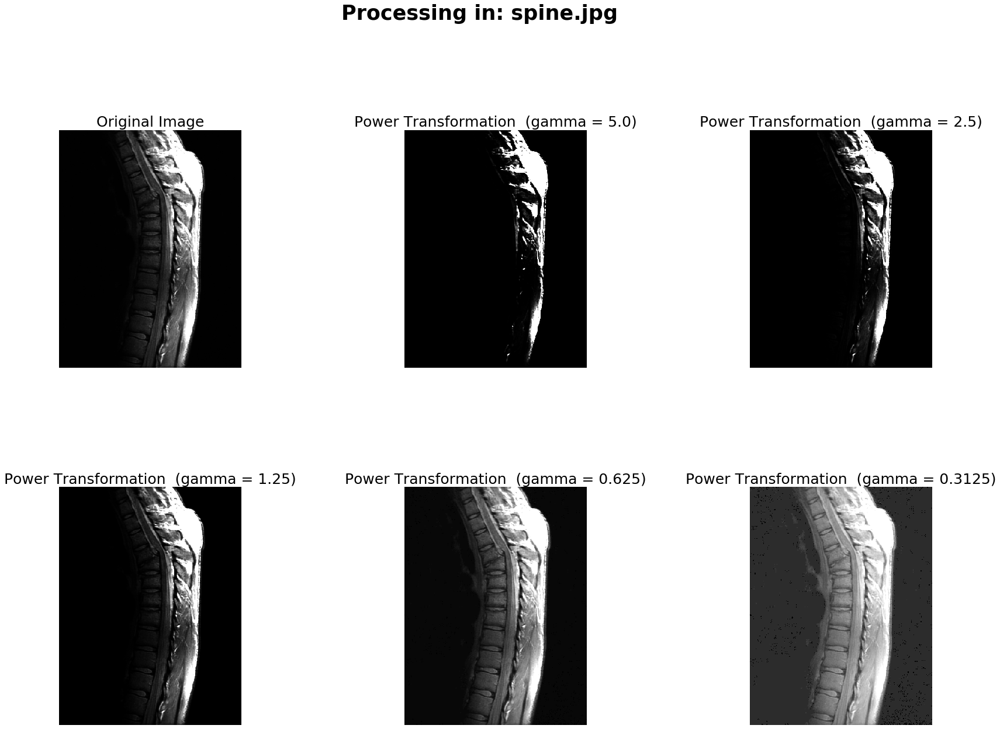

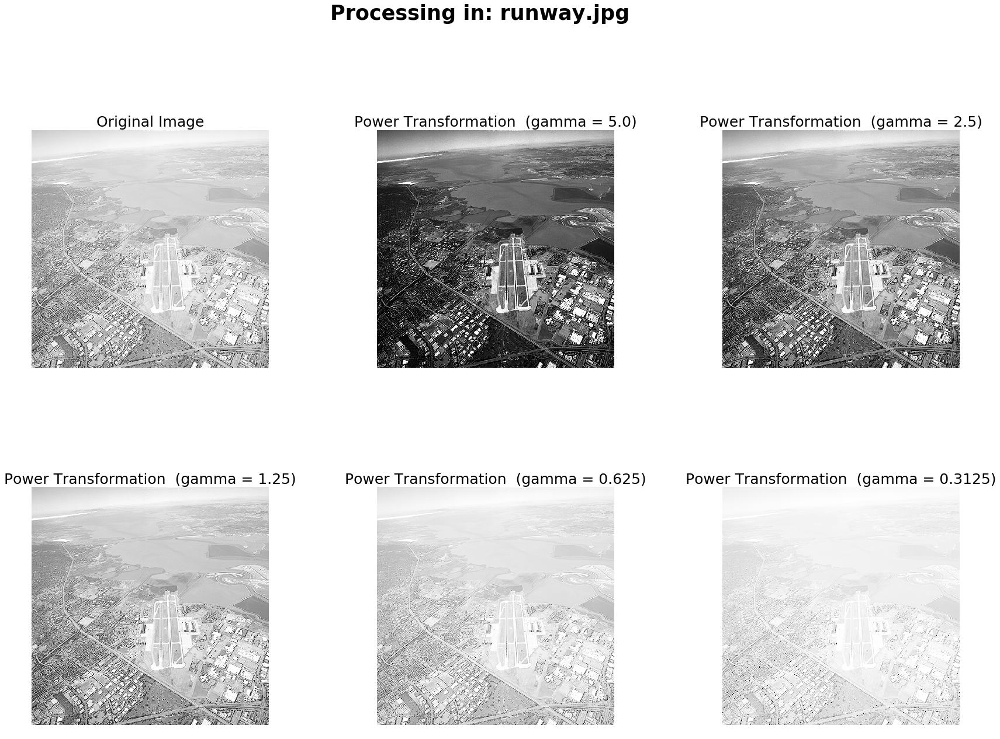

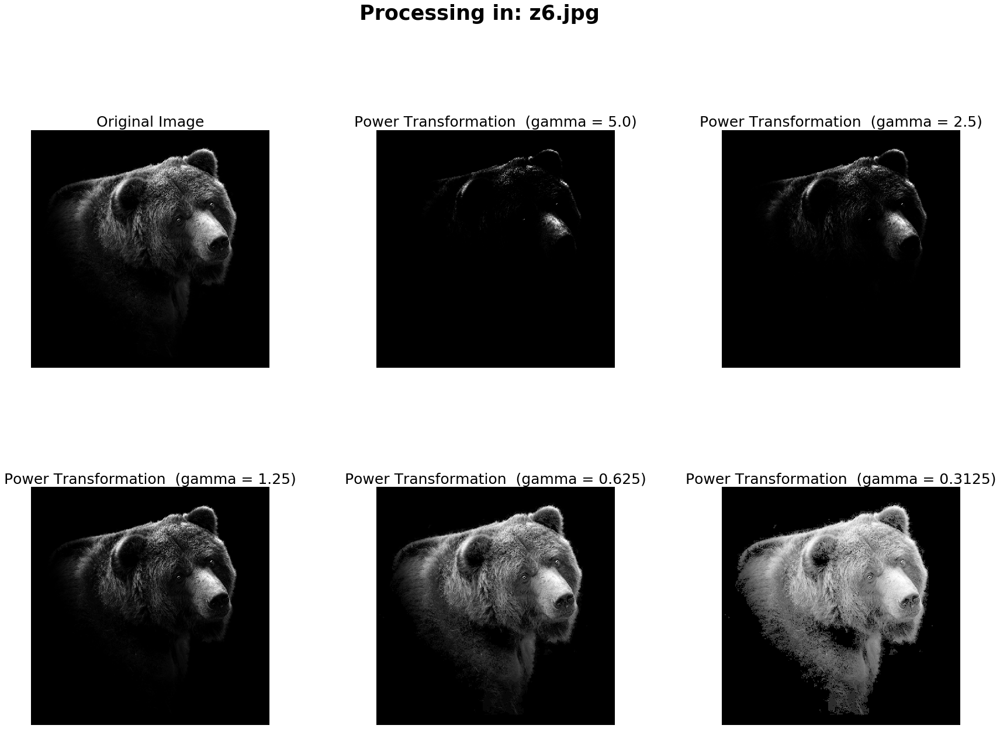

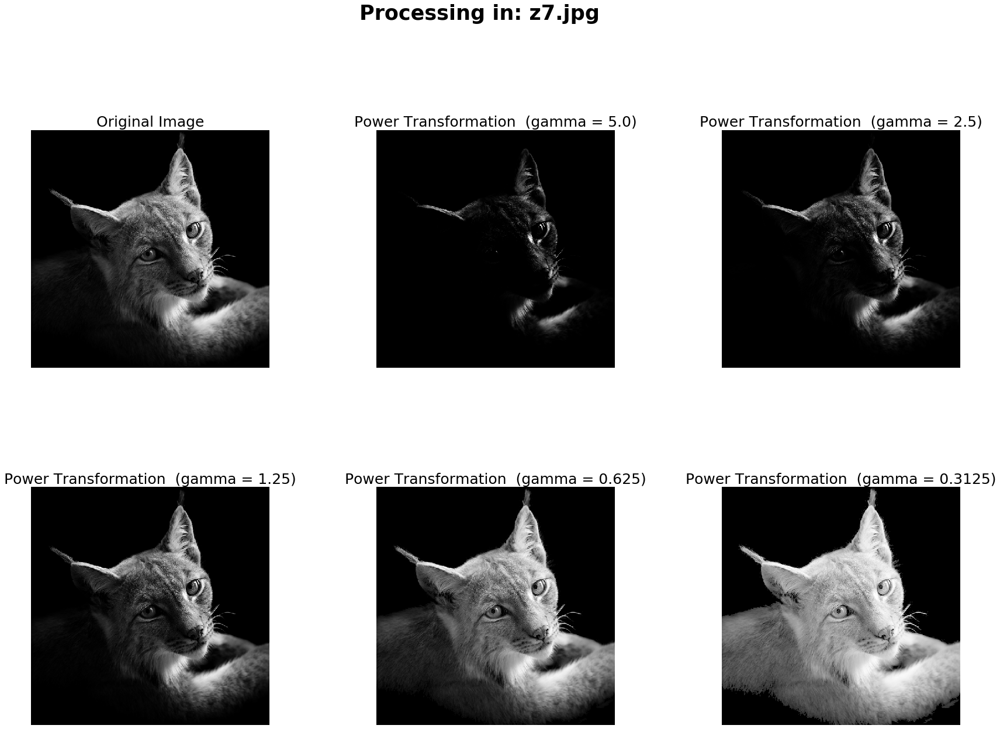

In [9]:
#Define function

def powerimg(img, gamma, c):
    norm_image = cv2.normalize(img, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F) #Normalizing the image to values in range 0 to 1
    power_image = norm_image.copy() #Making a copy of norm_image
    for i in range(0, np.size(norm_image,0)):
        for j in range(0, np.size(norm_image,1)): 
            power_image[i,j] = c*norm_image[i,j]**gamma #Original pixel value raised to the power of gamma, c = 1
    return power_image

image = cv2.imread("images/spine.jpg", cv2.IMREAD_GRAYSCALE) #Reading the image
image2 = cv2.imread("images/runway.jpg", cv2.IMREAD_GRAYSCALE) #Reading the image
image3 = cv2.imread("images/z6.jpg", cv2.IMREAD_GRAYSCALE) #Reading the image
image4 = cv2.imread("images/z7.jpg", cv2.IMREAD_GRAYSCALE) #Reading the image
vect = [image,image2,image3,image4]
vect_names = [imagesnames[6],imagesnames[13],imagesnames[11],imagesnames[2]]
for k in range(4):
    plt.figure(figsize=(30,30)); plt.subplot(3,3,1);plt.imshow(vect[k], cmap='gray'); plt.title('Original Image', fontsize=25);plt.axis('off') #Plotting the original image
    for gamma in range(1,6,1): #For loop that changes gamma value
        val = 10.0/(2**gamma)
        power_img = powerimg(vect[k], val,1) #Calling the function
        plt.subplot(3,3,gamma+1); plt.imshow(power_img, cmap='gray'); 
        plt.title('Power Transformation '+' (gamma = '+str(val)+')', fontsize=25);plt.axis('off')
        plt.subplots_adjust(hspace=.5)
        plt.suptitle("Processing in: "+vect_names[k], fontsize=35,fontweight="bold")  #Title every section of images
        


<h3>- Description of developed Function:</h3>
<p style="text-align:justify">The powerimg() function developed in this item receives three input parameters: The image array, the gamma value to be used in the transformation and a constant C. This function returns a new image which is the power transformation of the original image.</p>

<h3>- Description of library functions used in this section: </h3>
<p style="text-align:justify">The function developed in this item starts by normalizing the input image so that the pixel values range from 0 to 1 instead of ranging from 0 to 255. To do this, the normalize() function from the OpenCV library was used, which can normalize the norm or value range of an array. When used for the latter, as in this item, this function receives the original image, the lower and upper boundaries of the range, the normalization type (value range) and the data type of the output (float) as input parameters.
Having the normalized array, the power transformation of the original image is obtained by simply raising the values of the pixels from the normalized array to the power of gamma and multiplying the result by C, which is set to 1.</p>

<h3>-Analysis of the results obtained: </h3>
<p style="text-align:justify">
After obtaining the power transformations of the images while varying the gamma value,   it can be noticed that the higher the gamma value is, the darker the power transformation becomes.  This is mathematically understandable because the pixel values of the original image range from 0 to 1 due the normalization and raising them to the power of a positive integer will always produce an equal or smaller value. The power transformation only becomes lighter when the gamma value is less than 1, which is also mathematically understandable because raising a value to the power of a number less than 1 will produce a root of that value. If the values were greater than 1, that root would be a smaller value but because the values range from 0 to 1, the root results in a greater value and thus, the power transformation of the image is lighter than the original image.</p>

### Problem 3

Implement a function that performs smoothing on an input image with an averaging filter mask of size $n$. The function should take two inputs: an image matrix and the filter size $n$. Use the image <tt>test_pattern_blurring_orig.tif</tt> to test your algorithm. Use averaging filter masks of sizes $n = 3, 5, 9, 15, 35$. Analyze the results you obtained.

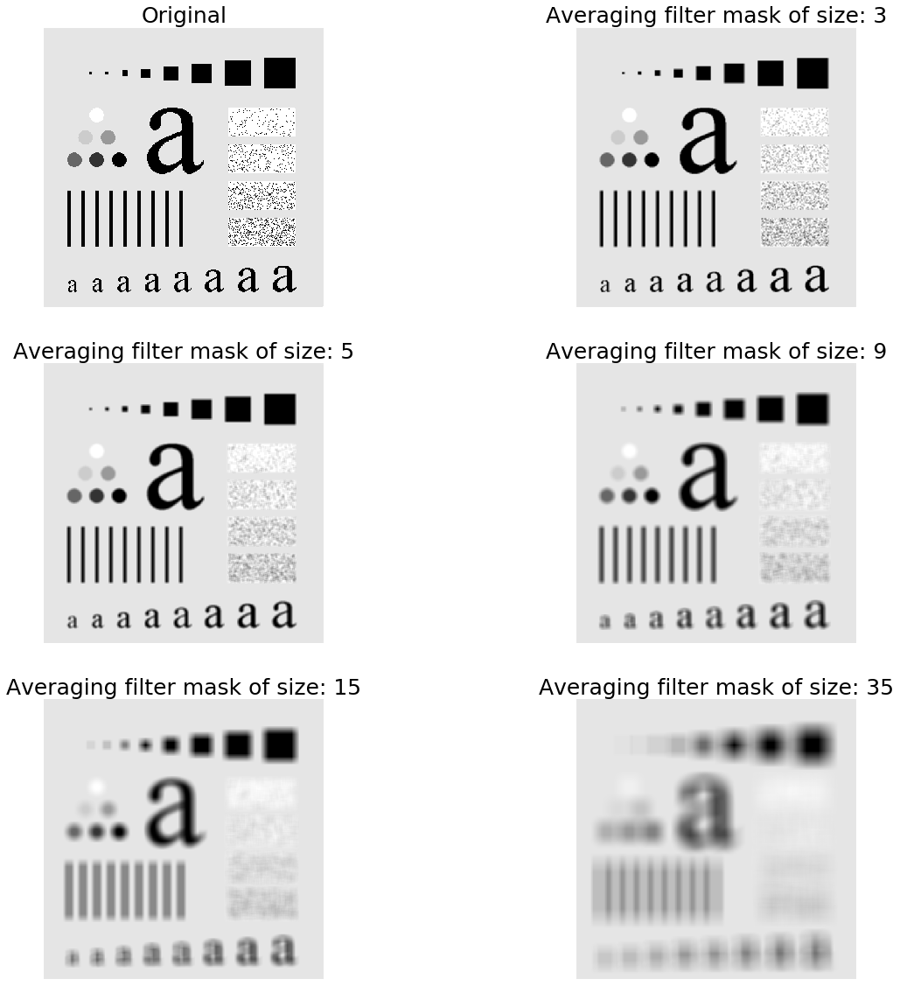

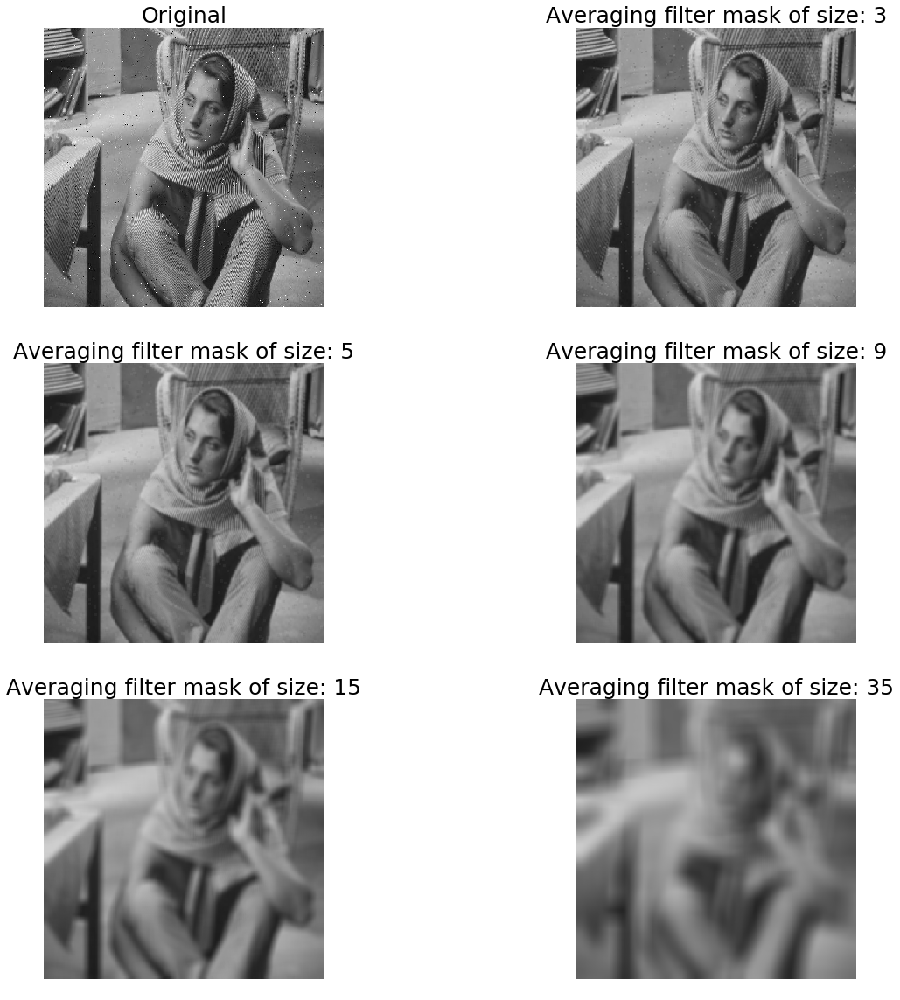

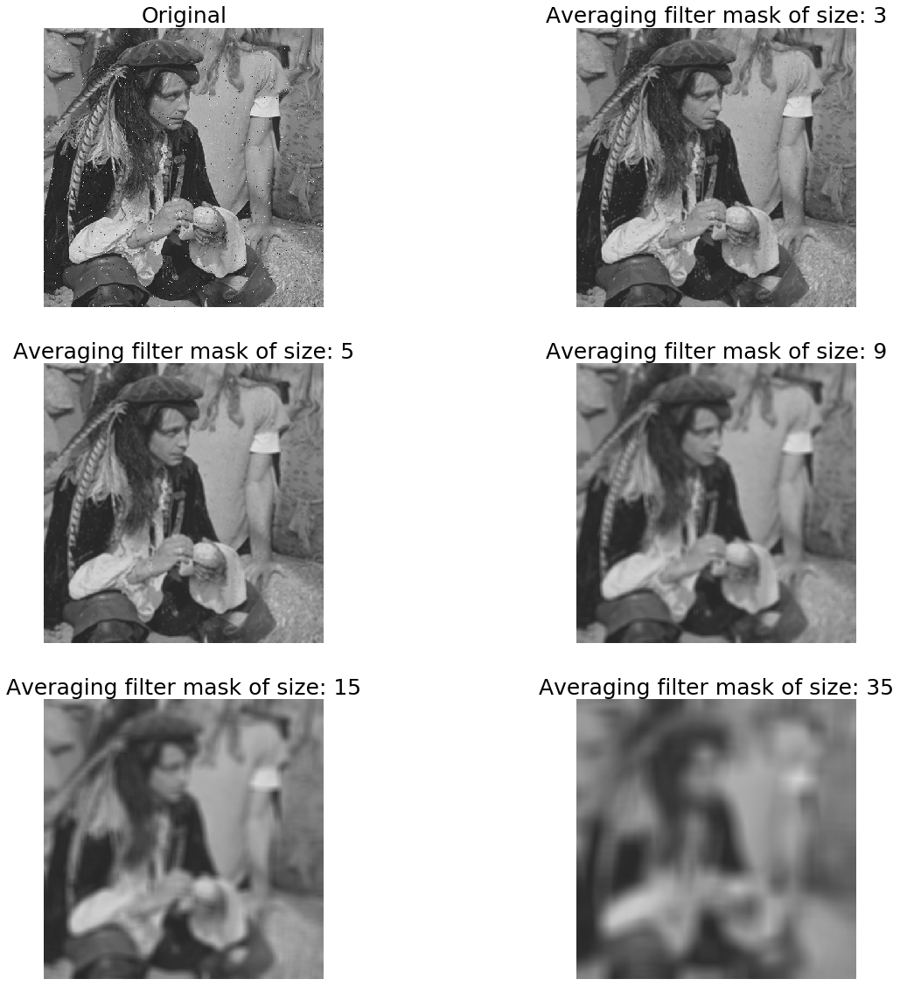

In [12]:
#Define function

def smooth_image(src,n):   
    kernel = np.ones((n,n),np.float32)/(n*n) #Create kernel of n*n size and make it and averaging filter (Divide by n*n)
    smoothed_image = cv2.filter2D(src,-1,kernel) #Filter2D() convolves a kernel with an specified image
    #The second parameter in filter2D() stands for depth. In this case it is a negative value (-1) which indicates 
    #that original image depth will be preserved.
    return smoothed_image   #return smoothed image

img = cv2.imread("images/"+imagesnames[0],1)    
img1 = cv2.imread("images/"+imagesnames[19],1)
img2 = cv2.imread("images/"+imagesnames[20],1)
vector = [img,img1,img2]
vector_names=[imagesnames[0],imagesnames[18],imagesnames[19]]
vector_of_mask_sizes = [3,5,9,15,35]  #Vector containing the required sizes of the filter masks

for k in range(3):
    #Plot
    plt.figure(figsize=(20,20));  #Create figure of 15*15 size
    plt.subplot(3,2,1);plt.imshow(vector[k]),plt.title('Original',fontsize=25)  #Plot original image
    plt.axis('off');  #Turn off axis to be showed

    for i in range(1,6):
   
        smoothed_image = smooth_image(vector[k],vector_of_mask_sizes[i-1])   #Call function with specified size of filter mask
        #inside of created vector
        plt.subplot(3,2,i+1);  #Create subplot
        plt.imshow(smoothed_image);plt.title('Averaging filter mask of size: '+str(vector_of_mask_sizes[i-1]),fontsize=25); #Title and smoothed image
        plt.axis('off');


<h3>- Description of developed Function:</h3>
<p style="text-align:justify">The function <i>smooth_image</i> developed in this section recieves two input parameters: the source image to be processed and the size of the filter mask to be applied. This function returns a smoothed image. The internal processing of this function is based on the creation of an averaging filter mask (kernel) of size n and the convolution of this kernel with an specified image. The averaging filter mask was created dividing a matrix of ones of size n by the multiplication of n*n. But as a division will be executed, the created matrix must have a float format.
</p>
<h3>- Description of library functions used in this section: </h3>
<p style="text-align:justify">
In order to sucessfully achieve the goal of this section, it was mandatory to use some of the functions previously described. Aditionally to this functions, it was also used the "np.ones()" function from the NUMPY library that receives two parameters as input: a given shape (rows and columns) and a given datatype (float in this case). This function returns a new array of the size and data type specified and filled with ones. With the matrix of ones defined, the averaging filter mask (kernel) was built, but in order to smooth the image it is necessary to convolve the kernel with the image. Therefore, it was used the function "cv2.filter2D()" from the OPENCV library, which performs the convolution of the kernel with the image. This function recieves three parameters as input: the source image, the depth of the resulting image, where -1 means that the depth of the new image will be the same as the source, and the kernel to be scanned through the image. With this, the smoothed image is obtained and returned at the end of the developed function right after the convolution operation. Finally, it is used a loop to plot the results of applying different sizes of averaging filter masks on the specified image. </p> 
<h3>-Analysis of the results obtained: </h3>
<p style="text-align:justify">
After implementing averaging filter masks in this section, it is clear that as the kernel sizes are increased, high frecuencies are attenuated producing the smoothing. When the kernel size is 3x3, the filtered image is merely smoothed and it can be seen that the amount of intensity variation between one pixel and the next is reduced. This size is tipically used for smoothing applications because the high frecuency attenuation is achieved and the changes are notorious without blurring the processed images. When the kernel size is increased, some problems could come up, because the blur on an image is directly related with the increase of the kernel size, and thus if a size of the kernel is reached, details of an image could end up being almost impossible to be noticed and the image itself would hardly recognizable which can be seen in the case of applying a 35x35 averaging filter.  </p> 

### Problem 4

Consider the image <tt>ckt_board_saltpep_prob_pt05.png</tt>. It has been corrupted with ‘salt-and-pepper’ noise (more formally known as impulse noise). Try to remove the noise from this image by applying a median filter of size 3x3. Compare the result to applying an averaging filter of size 3x3.  Increase the kernel size to 3x3, 5x5, 9x9, 15x15 and repeat. Analyze the results you obtained. Did the filter successfully remove the noise? Did you observe any other side effects?

You can also corrupt any image you like with a salt-and-pepper noise generator. Write another function which adds salt-and-pepper noise to an input image. Use that function to corrupt additional images. Try to recover the original images using a median filter of appropriate size.

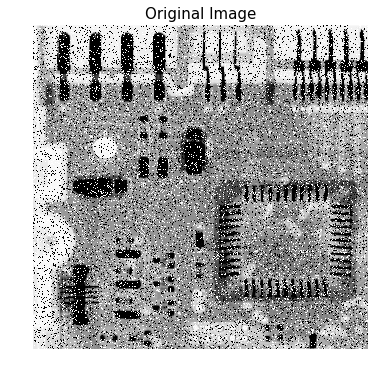

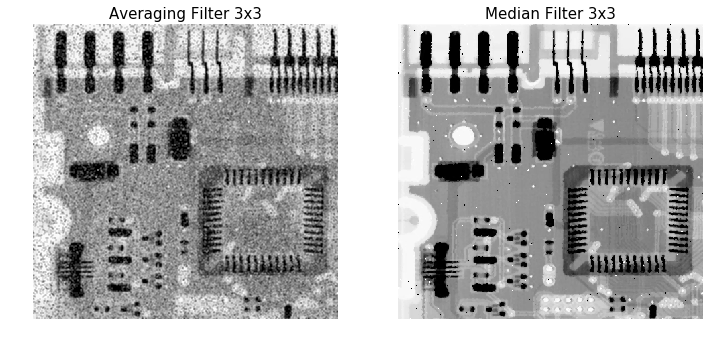

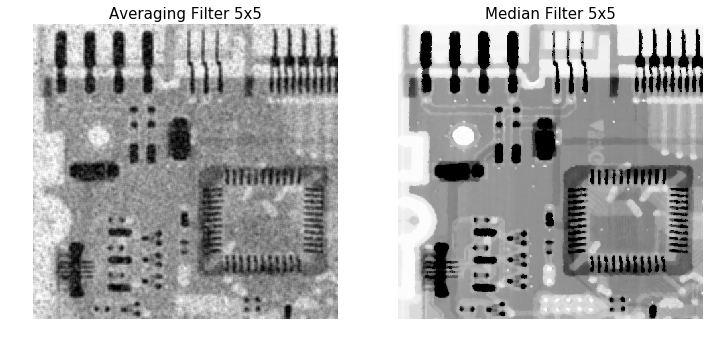

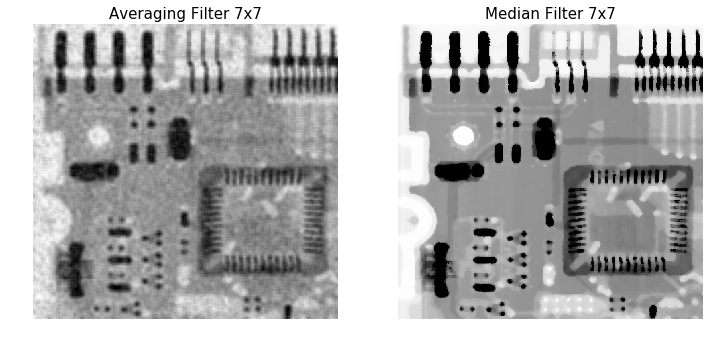

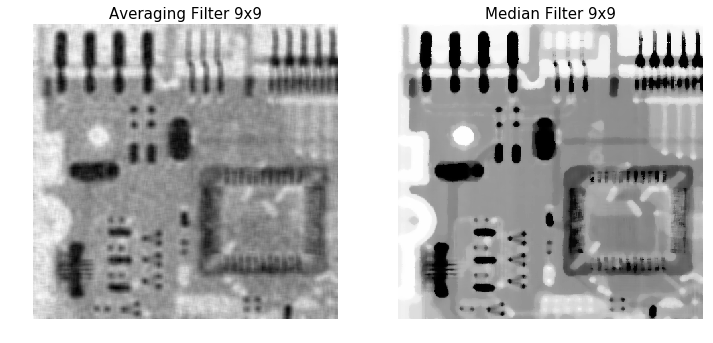

...

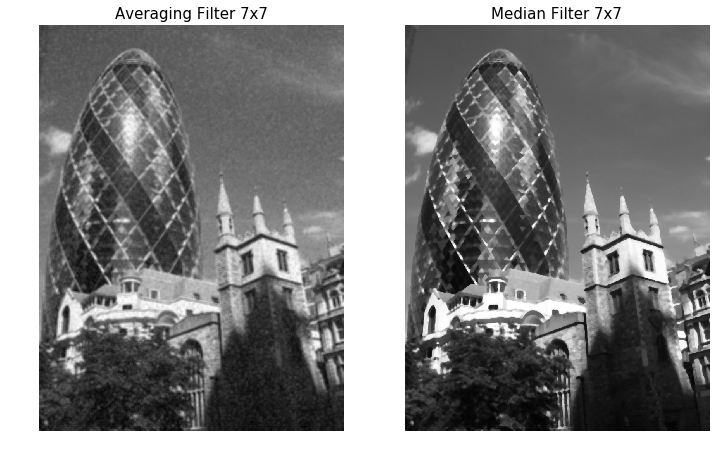

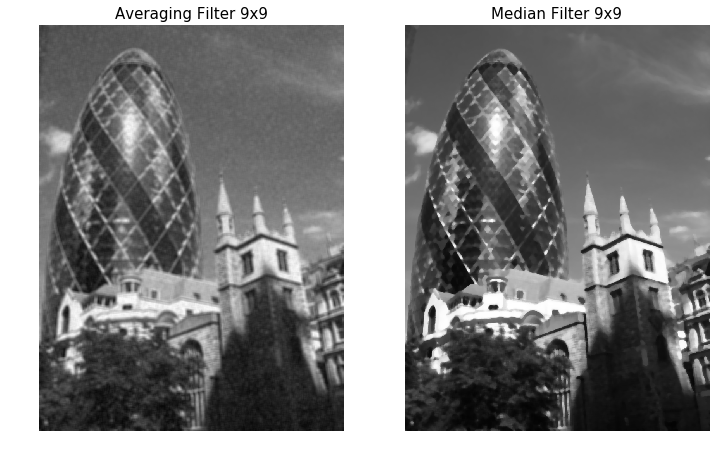

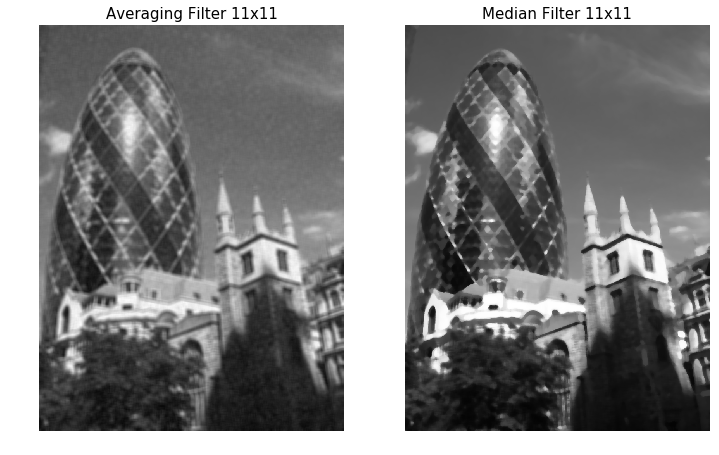

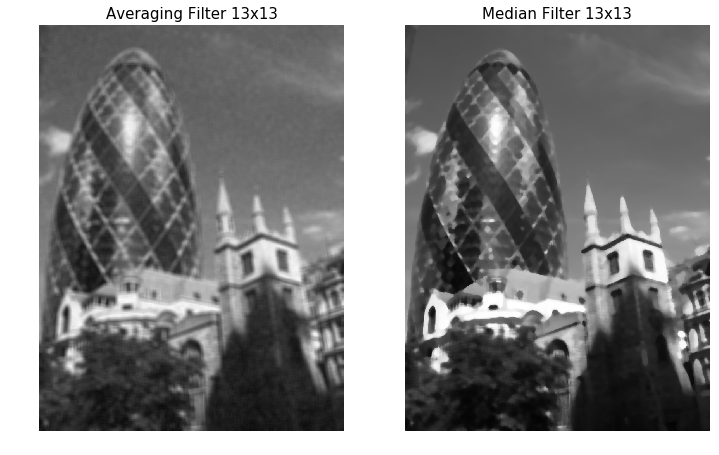

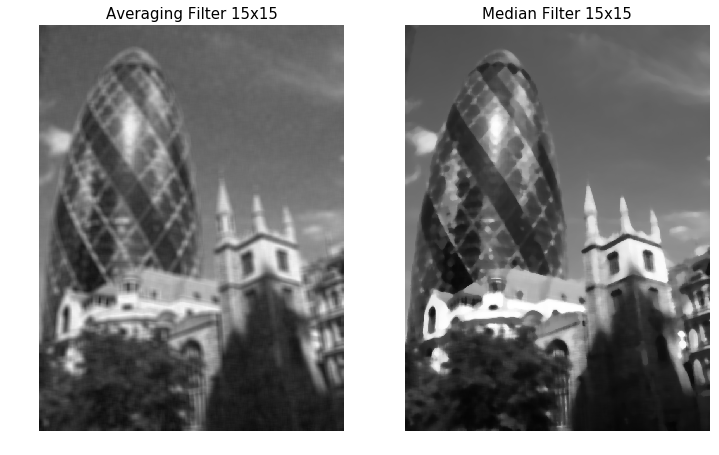

In [18]:
#Define function
def blurs(img):
    for i in range(3,17,2): #Varying the kernel size
        medianblur = cv2.medianBlur(img,i) #Applying median filter
        blur = cv2.blur(img,(i,i)) #Applying averaging filter
        plt.figure(figsize=(12,12)); plt.subplot(121); plt.imshow(blur, cmap='gray'); plt.title('Averaging Filter '+str(i)+"x"+str(i),fontsize="15");plt.axis('off')
        plt.subplot(122); plt.imshow(medianblur, cmap='gray'); plt.title('Median Filter '+str(i)+"x"+str(i),fontsize="15");plt.axis('off') #Plotting side to side

def sp_noise(image,per):

    output = np.zeros(image.shape,np.uint8) #Matrix of zeros with same size of input image
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random() #Random float number ranging from 0 to 1
            if rdn < per:  
                output[i][j] = random.randint(0,255) #If the random number is less than the input percentage, give the pixel a random value
            else:
                output[i][j] = image[i][j] #If its not, give the pixel the original pixel value
    return output

image = cv2.imread("images/ckt_board_saltpep_prob_pt05.png", cv2.IMREAD_GRAYSCALE) #Reading the image
plt.figure(figsize=(6,6)); plt.imshow(image, cmap='gray'); plt.title('Original Image',fontsize="15");plt.axis('off') #Plotting the original image
blurs(image) #Calling the subroutine
newim = cv2.imread("images/blurry_moon.png", cv2.IMREAD_GRAYSCALE) #Reading another image
plt.figure(figsize=(12,12)); plt.subplot(1,2,1);plt.imshow(newim, cmap='gray'); plt.title('Original Image',fontsize="15");plt.axis('off') #Plotting noisy image
noise_img = sp_noise(newim,0.20) #Adding salt and pepper noise
plt.subplot(1,2,2); plt.imshow(noise_img, cmap='gray'); plt.title('Noisy Image',fontsize="15");plt.axis('off') #Plotting noisy image
blurs(noise_img) #Calling the subroutine
img1 = cv2.imread("images/"+imagesnames[7],1)
plt.figure(figsize=(12,12)); plt.subplot(1,2,1);plt.imshow(img1, cmap='gray'); plt.title('Original Image',fontsize="15");plt.axis('off') #Plotting noisy image
noise_img = sp_noise(img1,0.10) #Adding salt and pepper noise
plt.subplot(1,2,2); plt.imshow(noise_img, cmap='gray'); plt.title('Salt-Pepper corrupted Image',fontsize="15");plt.axis('off') #Plotting noisy image
blurs(noise_img) #Calling the subroutine
img2 = cv2.imread("images/"+imagesnames[22],1)
plt.figure(figsize=(12,12)); plt.subplot(1,2,1);plt.imshow(img2, cmap='gray'); plt.title('Original Image',fontsize="15");plt.axis('off') #Plotting noisy image
noise_img = sp_noise(img2,0.10) #Adding salt and pepper noise
plt.subplot(1,2,2); plt.imshow(noise_img, cmap='gray'); plt.title('Salt-Pepper corrupted Image',fontsize="15");plt.axis('off') #Plotting noisy image
blurs(noise_img) #Calling the subroutine

<h3>- Description of developed Function:</h3>
<p style="text-align:justify">In this item, one subroutine and one function were developed: Blurs() and Sp_noise() respectively. The former, Blurs(), is a subroutine that receives an image array as input parameter and applies both a median filter and an average filter to this image with kernel sizes of 3x3, 5x5, 7x7, 9x9, 11x11, 13x13 and 15x15 while plotting the results side by side. The latter, Sp_noise(), is a function that receives as input parameter an image array and a percentage. The function returns the original image corrupted with salt and pepper noise. The amount of noise in the image is determined by the input percentage, a number ranging from 0 to 1.</p>

<h3>- Description of library functions used in this section: </h3>
<p style="text-align:justify">
The Blurs() subroutine applies the median and the average filter by using the medianBlur() and Blur() functions from the OpenCV library. Both functions receive the original image and the size of the kernel to be used as input parameters, with the size being an integer in the medianBlur() function and a tuple with the width and height in the Blur() function, and they both return the filtered image. Finally, the images are plotted side to side using the subplot() function of the Matplotlib library. This process is done within a for loop that goes from 3 to 15 with increments of 2 that determine the size of the filters kernel.
The Sp_noise() function, which applies salt and pepper noise to its input image array, works this way: For every pixel of the image, a random number ranging from 0 to 1 is generated with the random() function of the Random library. If this random number is greater than the input percentage, which is a number also ranging from 0 to 1, that pixel value will be equal to the equivalent pixel of the original image. Otherwise, that pixel value will be equal to a random integer ranging from 0 to 255 that is generated with the randint() function of the Random library. This function receives the upper and lower boundaries of the range from which the resulting number will be taken.</p>

<h3>-Analysis of the results obtained: </h3>
<p style="text-align:justify">
After applying both the median filter and the averaging filter with kernel size of 3x3 to the noisy image, its clear that the median filter does a considerably better job at removing the noise from the image. While the averaging filter just blurs the image, the median filter almost removes the noise completely with almost imperceptible distortions.</p>
<p style="text-align:justify">
The problems start when the kernel size increases. In the case of the averaging filter, the blur increases to the point that the details of the image are almost impossible to notice and the image itself is hardly recognizable. In the case of the median filter, at first, the noise is reduced even further with minor distortions in the image, though the reduction in noise is much less prominent than the increase in distortion. With kernel sizes above 9x9 the image is perceived as blurry and by 15x15, the finer details are completely lost.</p>

### Problem 5 

`1. Write a function that sharpens an image using the Laplacian kernel. Your function should first compute the Laplacian of the input image using the following kernel:
<table>
<tr>
<td>0</td>
<td>1</td>
<td>0</td>
</tr>
<tr>
<td>1</td>
<td>-4</td>
<td>1</td>
</tr>
<tr>
<td>0</td>
<td>1</td>
<td>0</td>
</tr>
</table>

2. Visualize the Laplacian of the input image. You may consider using a power intensity transformation to enhance the Laplacian image for visualization.

3. Recall that sharpening is achieved by subtraction: $g(x,y) = f(x,y) - \nabla^2 f(x,y) $. Use this method to produce an enhanced image.

4. Recall that subtraction and filtering with a kernel are linear operations. Therefore, it is possible to combine both operations into a single kernel:
<table>
<tr>
<td>0</td>
<td>-1</td>
<td>0</td>
</tr>
<tr>
<td>-1</td>
<td> 5</td>
<td>-1</td>
</tr>
<tr>
<td>0</td>
<td>-1</td>
<td>0</td>
</tr>
</table>
Write another function that directly sharpens the image using this single kernel.

5. Finally, recall that there is an alternative kernel that can be used to compute a Laplacian: 
<table>
<tr>
<td>1</td>
<td>1</td>
<td>1</td>
</tr>
<tr>
<td>1</td>
<td> -8</td>
<td>1</td>
</tr>
<tr>
<td>1</td>
<td>1</td>
<td>1</td>
</tr>
</table>
Write another function that produces a sharpened image using a single enhancement kernel that is based on this alternative definition of the Laplacian.

Apply all the functions you wrote to the image <tt>blurry_moon.png</tt>. Compare, analyze and comment all the results. You are also encouraged to try out your functions on more testing images.

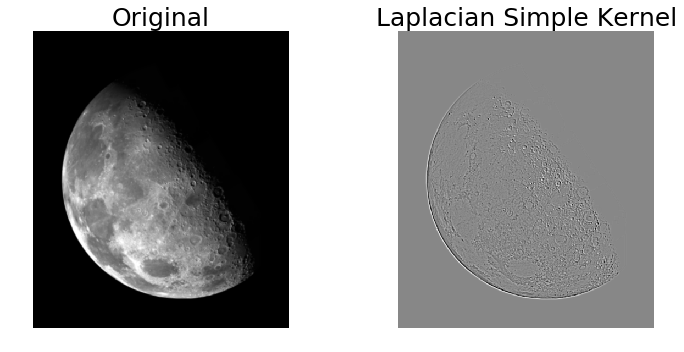

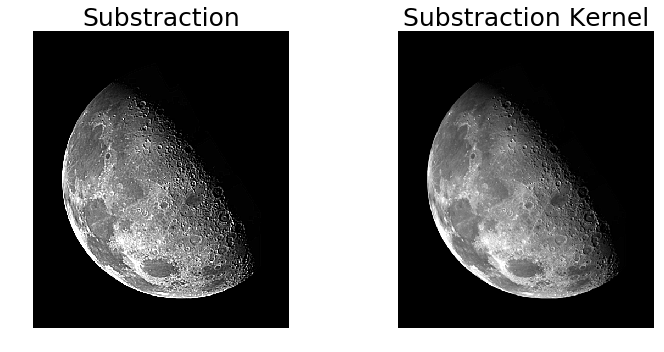

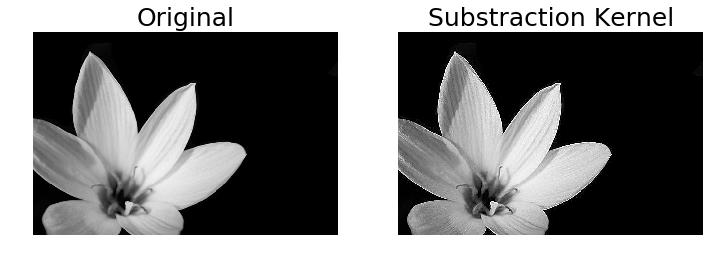

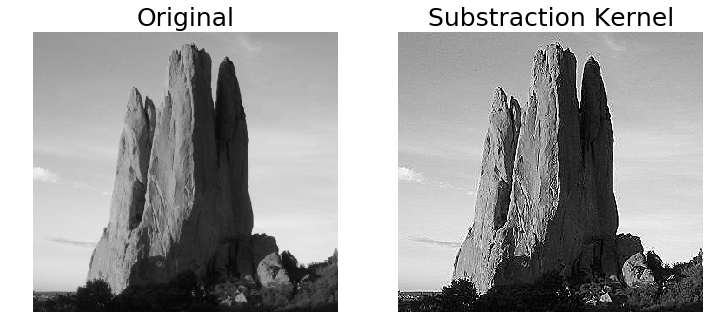

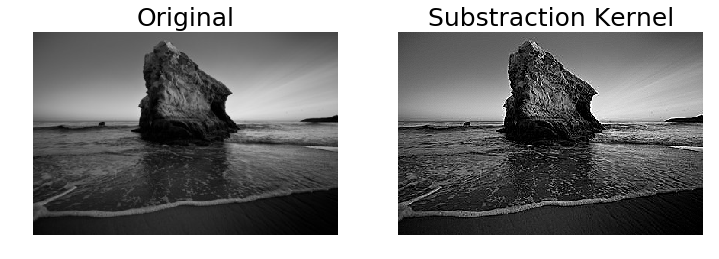

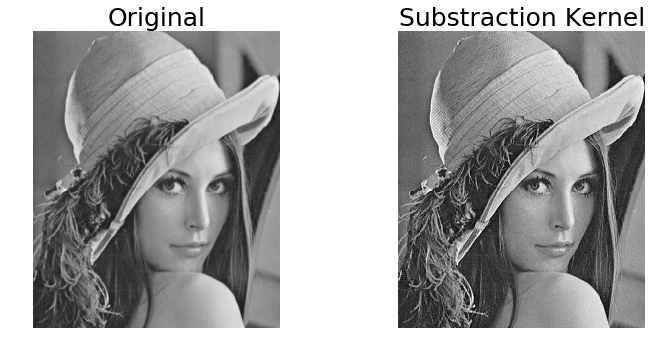

In [19]:
#Define Function

# Subtraction and laplacian
def Subtraction_Lap(img): #Function to apply the substraction kernel
    kernel_sub=np.array([[0,-1,0],[-1,5,-1],[0,-1,0]],dtype=np.float32) #Build the substraction kernel
    imgSubK = cv2.filter2D(img,-1,kernel_sub)  #Apply the kernel
    return imgSubK   #Return the result

# Simple Laplacian
def Simple_Laplacian(img):           #Function to apply the Simple Laplacian Kernel
    kernel_S = np.array([[0,1,0],[1,-4,1],[0,1,0]],dtype=np.float32) #Build Simple Laplacian kernel 
    imgSL = cv2.filter2D(img,-1,kernel_S)  #Apply the kernel
    imgSubS=img-imgSL #Do the substraction of the original image and the simple Laplacian
    imgSubS_K=Subtraction_Lap(img) #Apply the substraction kernel
    return [imgSL,imgSubS, imgSubS_K]  #return the laplacian, Substraction_Lap output and the manual substraction

# Variant Laplacian 
def Variant_Laplacian(img): #Function to apply the Variant Kernel
    kernel_V = np.array([[1,1,1],[1,-8,1],[1,1,1]],dtype=np.float32) #Build the Variant Laplacian kernel
    imgVL = cv2.filter2D(img,-1,kernel_V)  #Apply the  kernel
    imgSubV=img-imgVL #Do the substraction of the original image and the variant Laplacian
    imgSubV_K=Subtraction_Lap(img) #Apply the substraction kernel
    return [imgVL,imgSubV,imgSubV_K]   #return the laplacian, Substraction_Lap output and the manual substraction

#Load images
img = cv2.imread ('images/blurry_moon.png',cv2.IMREAD_GRAYSCALE).astype("float32") #Read original image
img_2 = cv2.imread ('images/g.jpg') #Read original image 2
img_5 = cv2.imread ('images/lena.jpg') #Read original image 3
img_3 = cv2.imread ('images/z4.jpg') #Read original image 3
img_4 = cv2.imread('images/z5.jpg')

#Call functions
LaplacianV, subtractionV,subtractionV_K= Variant_Laplacian(img) # Aplicar Variant_Laplacian función
LaplacianV_2, subtractionV_2, subtractionV_K_2= Variant_Laplacian(img_2) # Aplicar Variant_Laplacian función
LaplacianV_3,subtractionV_3, subtractionV_K_3= Variant_Laplacian(img_3) # Aplicar Variant_Laplacian función
LaplacianV_4, subtractionV_4,subtractionV_K_4= Variant_Laplacian(img_4) # Aplicar Variant_Laplacian función
LaplacianV_5, subtractionV_5, subtractionV_K_5= Variant_Laplacian(img_5) # Aplicar Variant_Laplacian función


#Plotting
plt.figure(figsize=(12,12)); 
plt.subplot(2,2,1);plt.imshow(img, cmap='gray');plt.title("Original",fontsize=25);plt.axis('off')           #Display the image
plt.subplot(2,2,2);plt.imshow(LaplacianV,cmap='gray');plt.title("Laplacian Simple Kernel",fontsize=25);plt.axis('off')           #Display the image
plt.figure(figsize=(12,12)); 
plt.subplot(2,2,1); plt.imshow(subtractionV, cmap='gray', vmin=0, vmax=255);plt.title("Substraction",fontsize=25);plt.axis('off')           #Display the image
plt.subplot(2,2,2); plt.imshow(subtractionV_K, cmap='gray', vmin=0, vmax=255);plt.title("Substraction Kernel",fontsize=25);plt.axis('off')           #Display the image
plt.figure(figsize=(12,12)); 
plt.subplot(2,2,1);plt.imshow(img_2, cmap='gray');plt.title("Original",fontsize=25);plt.axis('off')           #Display the image
plt.subplot(2,2,2); plt.imshow(subtractionV_K_2,cmap='gray', vmin=0, vmax=255);plt.title("Substraction Kernel",fontsize=25);plt.axis('off')           #Display the image


plt.figure(figsize=(12,12)); 
plt.subplot(2,2,1);plt.imshow(img_3, cmap='gray');plt.title("Original",fontsize=25);plt.axis('off')           #Display the image
plt.subplot(2,2,2); plt.imshow(subtractionV_K_3, cmap='gray', vmin=0, vmax=255);plt.title("Substraction Kernel",fontsize=25);plt.axis('off')  #Display the image

plt.figure(figsize=(12,12)); 
plt.subplot(2,2,1);plt.imshow(img_4, cmap='gray');plt.title("Original",fontsize=25);plt.axis('off')           #Display the image
plt.subplot(2,2,2); plt.imshow(subtractionV_K_4, cmap='gray', vmin=0, vmax=255);plt.title("Substraction Kernel",fontsize=25);plt.axis('off')  #Display the image

plt.figure(figsize=(12,12)); 
plt.subplot(2,2,1);plt.imshow(img_5, cmap='gray');plt.title("Original",fontsize=25);plt.axis('off')           #Display the image
plt.subplot(2,2,2); plt.imshow(subtractionV_K_5, cmap='gray', vmin=0, vmax=255);plt.title("Substraction Kernel",fontsize=25);plt.axis('off')  #Display the image

plt.show()

<h3>- Description of developed Function:</h3>
<p style="text-align:justify">
For this item, three functions were developed. The first function, Subtraction_Lap(), receives the original image as input parameter, applies the laplacian and substraction kernel to the input image and returns the processed image. The second function, Simple_Laplacian(), receives the image to be processed as input parameter, applies the laplacian kernel to the input image, manually substracts the result from the original image and calls the Substraction_Lap() function. This function has three outputs: the laplacian of the input image, the output of Substraction_Lap() and the manual substraction of both the laplacian and the input image. Finally, the Variant_Laplacian() function receives the image to be processed as input parameter. This function applies the variant laplacian kernel to the input image to obtain the laplacian, subtracts it from the image, calls the Substraction_Lap() function and returns the laplacian, the output of Substraction_Lap() and the manual substraction of the obtained laplacian and the input image.
</p>

<h3>- Description of library functions used in this section: </h3>
<p style="text-align:justify">
For the development of this item, various functions of the OpenCV library were used, like the previously mentioned ones for reading and showing images. Of the used functions, the most important in this item was the Filter2D() function which applies a kernel to an image and returns the result. This function receives three input parameters:  The original image, the desired depth of the output image and the kernel to be applied. In the developed functions, the desired depth is set to the original image depth and the kernel is entered to the function as an array with different values depending from the specific function.
</p>

<h3>-Analysis of the results obtained: </h3>
<p style="text-align:justify">
It can be observed that when applying the basic laplacian kernel to the image and then doing manually the substraction of the laplacian to the original image, the result is almost the same as the one obtained when applying the kernel that combines the laplacian and the substraction to the original image. Also, it should be noted that when the variant kernel is applied, the details of the image are better highlighted. This makes possible to identify the variant laplacian kernel as the better option to obtain an image with more defined details. Finally, its observed that by repeating this process to other images, similar results are obtained. In other words, the obtained images have the details of the originals much more accentuated.
</p>

Compare, analyze and comment all the results. You are also encouraged to try out your functions on more testing images.


## Problem 6

The gradient of an image is the two-dimensional vector

$\nabla \mathbf{f} = \left[ \begin{array}{c}G_x\\G_y\end{array} \right] 
=\left[ \begin{array}{c}\frac{\partial f}{\partial x}\\ \frac{\partial f}{\partial y} \end{array} \right]
$

1. Write a function that calculates the image gradients in the $x$ and $y$ directions. Use the following Sobel operators to compute the derivatives:
<table>
<tr>
<td>-1</td>
<td>-2</td>
<td>-1</td>
</tr>
<tr>
<td>0</td>
<td>0</td>
<td>0</td>
</tr>
<tr>
<td>1</td>
<td>2</td>
<td>1</td>
</tr>
</table>
<table>
<tr>
<td>-1</td>
<td>0</td>
<td>1</td>
</tr>
<tr>
<td>-2</td>
<td>0</td>
<td>2</td>
</tr>
<tr>
<td>-1</td>
<td>0</td>
<td>1</td>
</tr>
</table>
The function should output two variables, $G_x$ and $G_y$, which correspond to the derivatives in the $x$ and $y$ directions. Visualize the resulting gradients. Analyze the results obtained. How can you interpret the gradient operators?

2. Write another function that computes the gradient magnitude of an image. Recall that the magnitude of the gradient vector can be computed by:<br>
$\nabla f = \text{mag}(\nabla \mathbf{f}) = \left[ G_x^2 + G_y^2 \right]^\frac{1}{2}$.

3. Write another function that computes an approximation of the gradient magnitude using the following equation: <br>
$\nabla f \approx |G_x| + |G_y|$. <br>
Visualize and compare the resulting gradient magnitudes computed using both methods. How can you interpret the gradient magnitude?

You may use the images <tt>contact_lens_original.png</tt> and <tt>face.png<tt> to test your algorithms.


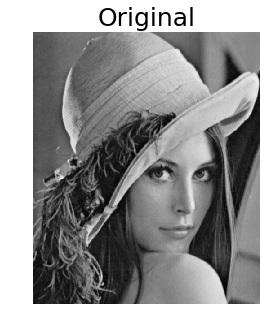

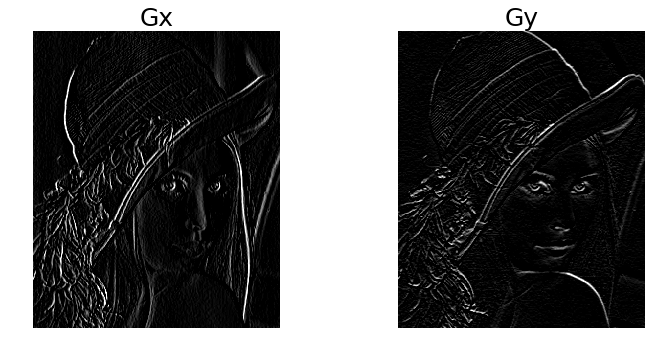

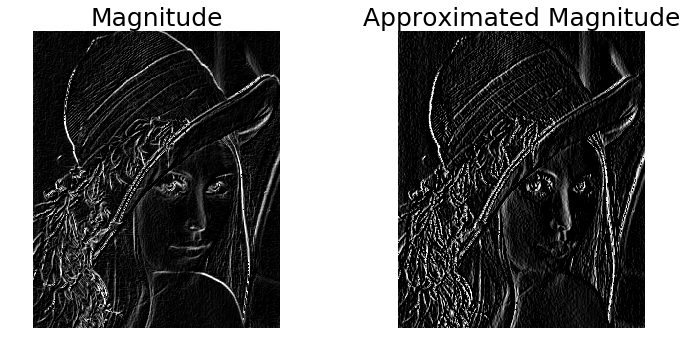

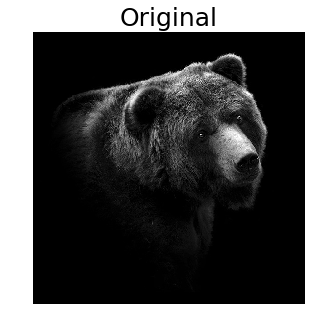

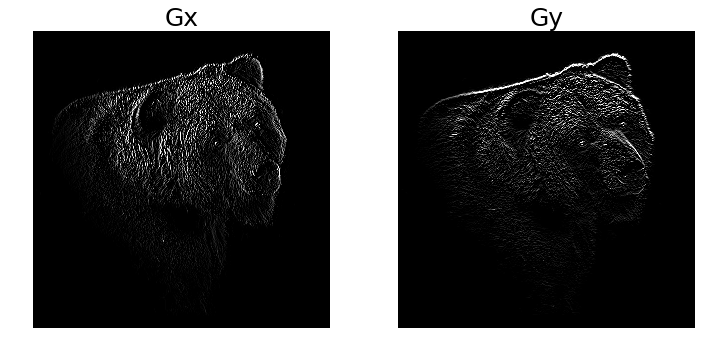

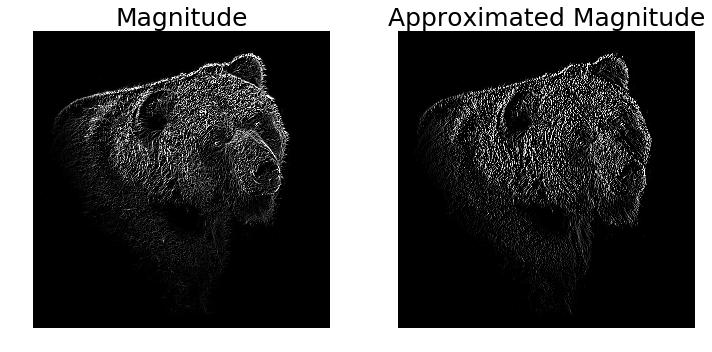

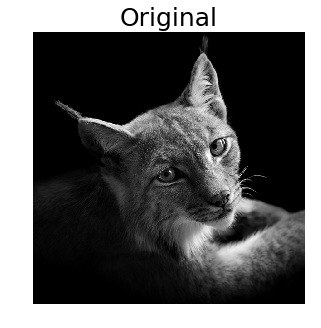

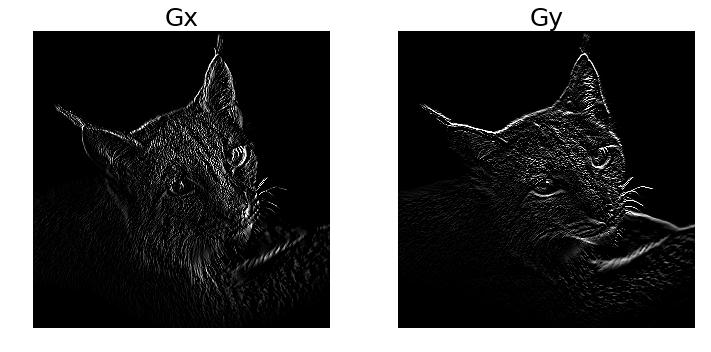

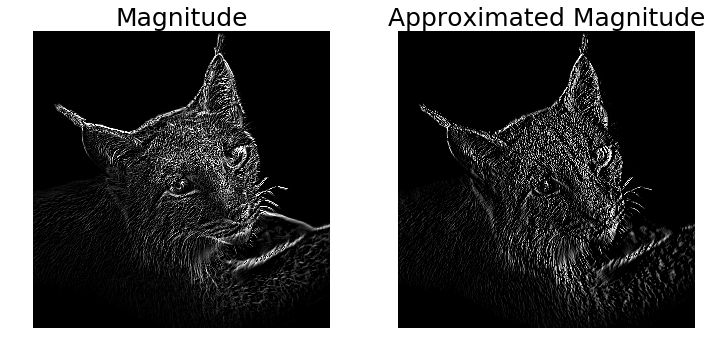

In [66]:
# Gradient

def calculate_image_gradient(img,kernel_Gx,kernel_Gy): #Function that calculates the image gradients in the x and y directions.
    Gx= cv2.filter2D(img,-1,kernel_Gx) #Convolve image with x-direction derivative kernel
    Gy= cv2.filter2D(img,-1,kernel_Gy) #Convolve image with y-direction derivative kernel
    return [Gx, Gy] #Return x and y direction derivatives


def compute_gradient_magnitude(Gx,Gy): #Function that computes the gradient magnitude of an image
    Gx= Gx^2  #Squaring x-direction derivative
    Gy= Gy^2  #Squaring y-direction derivative
    Gx_Gy=(Gx^2)+(Gy^2) #Sumar los resultados anteriores 
    mag_gradient= Gx_Gy^(1/2) #Sacar la raíz cuadrada de la suma
    return mag_gradient # Return gradient magnitude

def compute_aproximated_gradientmagnitude(Gx,Gy): #Function that computes an approximation of the gradient magnitude
    abs_Gx=cv2.convertScaleAbs(Gx) #X-Direction derivative magnitude
    abs_Gy=cv2.convertScaleAbs(Gy) #Y-Direction derivative magnitude
    mag_aprox=abs_Gx+abs_Gx #Sum of both derivatives magnitude 
    return mag_aprox  # Return approximated magnitude of gradient


img = cv2.imread ('images/lena.jpg',cv2.IMREAD_GRAYSCALE) #leer imagen
img2 =cv2.imread ('images/z6.jpg',cv2.IMREAD_GRAYSCALE) #leer imagen 
img3 =cv2.imread ('images/z7.jpg',cv2.IMREAD_GRAYSCALE) #leer imagen 
img_vector = [img,img2,img3]
img_names=[imagesnames[20],imagesnames[10],imagesnames[2]]
kernel_Gy = np.array([[-1,-2,-1],[0,0,0],[1,2,1]]) #Y-Direction derivative Kernel (Sobel Operator) 
kernel_Gx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]]) #X-Direction derivative Kernel (Sobel Operator) 

for k in range(3):
    Gx,Gy = calculate_image_gradient(img_vector[k],kernel_Gx,kernel_Gy) #Call function calculate_image_gradient
    mag_gradient = compute_gradient_magnitude(Gx,Gy)  #Call function compute_gradient_magnitude
    mag_aprox1 = compute_aproximated_gradientmagnitude(Gx,Gy) #Call function compute_aproximated_gradientmagnitude
    plt.figure(figsize=(5,5)); plt.imshow(img_vector[k],cmap='gray');plt.title("Original",fontsize=25);plt.axis('off') #Display original image
    plt.figure(figsize=(12,12)); 
    plt.subplot(2,2,1);plt.imshow(Gx,cmap='gray');plt.title("Gx",fontsize=25);plt.axis('off')           #Display the image
    plt.subplot(2,2,2);plt.imshow(Gy,cmap='gray');plt.title("Gy",fontsize=25);plt.axis('off')           #Display the image
    plt.figure(figsize=(12,12)); 
    plt.subplot(2,2,1);plt.imshow(mag_gradient,cmap='gray');plt.title("Magnitude",fontsize=25);plt.axis('off')           #Display the image
    plt.subplot(2,2,2);plt.imshow(mag_aprox1,cmap='gray');plt.title("Approximated Magnitude",fontsize=25);plt.axis('off')           #Display the image

    plt.show()

<h3>- Description of developed Function:</h3>
<p style="text-align:justify">
To develop this item it was necessary to create three functions.The first function receives three input parameters: The source image to be processed and the Kernels to be applied in order to calculate the derivatives in the x-direction and y-direction. In this case, these kernels correspond to sobel operators which are an approximation of the gradient operator. This function returns the derivatives in the x and y directions. The second and third function recieve the derivatives in the x and y directions(Gx and Gy) as input parameters, and return the magnitude of the gradient and the approximate magnitude of the gradient respectively.
</p>

<h3>- Description of library functions used in this section: </h3>
<p style="text-align:justify">
In order to develop this item, OPENCV library functions already described, were used again. Additionally,the function "convertScaleAbs" was used, which computes the absolute value of a given array and converts the result to 8-bit. This function recieves as input parameter an array, which in this case corresponds to an image. 
</p>

<h3>-Analysis of the results obtained: </h3>
<p style="text-align:justify">
The image gradients in x and y directions are commonly used to extract information from an image, as they provide information on a directional change in color intensity of an image. The gradient is zero in areas of constant intensity and proportional to the degree of intensity change in areas where intensity values vary. The gradient operators calculate an approximation of the gradient of the image intensity function, allowing to highlight the horizontal and vertical changes of the image. Particularly, it is important to remark that, calculating the image gradient in the x direction(applying the first derivative with respect of x) allows to highlight vertical changes on the image and on the other hand, calculating the image gradient in the y direction allows to highlight horizontal changes. Additionally, it is important to mention that gradient operators map in two dimensions the high gradient areas (equivalent to borders and plotted in white) and the rest (the background of the generated image plotted in black).</p>
<p style="text-align:justify">
As it can be observed of the obtained results, the magnitude of the gradient characterizes edges of an image as they measure changes in intensity of every pixel of an image for both x and y directions, and so pixels with large gradient values become possible edge pixels, which makes sense considering that images brightness changes sharply on the edges.
Finally, it is important to note that the results obtained from the magnitude and the approximated magnitude of the gradient are almost the same, in both it is possible to notice the horizontal and vertical changes of the image.


</p>